<a href="https://colab.research.google.com/github/Abi-Lowkey/MachineLearningTasks/blob/main/UASMachineLearning/Unit_3_Vision_Transformers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Transfer Learning: Vision Transformers**
## **Image Classification**

---

Transfer learning is a technique where a pre-trained model, which has already learned features from one task, is used as the starting point for a similar task. This saves time and resources by leveraging the existing knowledge of the model instead of training a new model from scratch.

In this tutorial, we will be looking at how we can apply transfer learning for image classification with a Vision Transformer on any dataset of our choice.

In transfer learning, we do not need to update the parameters of the entire model. Since our ViT has learned feature representations from millions of images, we can just choose to train the very last layers of our model to make it perform well on our new dataset.

For this tutorial, we will be using [google/vit-base-patch16-224](https://huggingface.co/google/vit-base-patch16-224) model from the Hugging Face hub.

### Let's begin by importing some necessary modules and functions
---

In [ ]:
!pip install --quiet evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 14.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
import io
from PIL import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from huggingface_hub import notebook_login

from datasets import load_dataset, DatasetDict

from transformers import AutoImageProcessor, ViTForImageClassification

from transformers import Trainer, TrainingArguments

import evaluate

In [ ]:
# Login onto Hugging Face hub to load any private dataset/model.
# We need to login as we'll also upload our model to the hub
notebook_login()

### Now, let's load our image classification dataset
---

For this tutorial, we'll be using [Oxford-IIIT Pets Dataset](https://huggingface.co/datasets/pcuenq/oxford-pets). It is a collection of 37 different cat and dog breed images. We'll be using [Hugging Face Datasets](https://huggingface.co/datasets) library to load our dataset easily from the hub.

In [ ]:
dataset = load_dataset('pcuenq/oxford-pets')
dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/565 [00:00<?, ?B/s]

dataset_infos.json:   0%|          | 0.00/1.10k [00:00<?, ?B/s]

(…)-00000-of-00001-ecc2afb43dedd5e0.parquet:   0%|          | 0.00/234M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/7390 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['path', 'label', 'dog', 'image'],
        num_rows: 7390
    })
})

#### The dataset contains the following features:

- path: a path to the file
- label: the breed of the animal
- dog: indicates if the animal is a dog or not
- image: the raw image data stored as bytes, which can be converted into formats like PIL Image for further processing.

In [ ]:
dataset['train'][0]

{'path': '/data/datasets/magic-ml/oxford-iiit-pet/images/Siamese_137.jpg',
 'label': 'Siamese',
 'dog': False,
 'image': {'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x08\x06\x06\x07\x06\x05\x08\x07\x07\x07\t\t\x08\n\x0c\x14\r\x0c\x0b\x0b\x0c\x19\x12\x13\x0f\x14\x1d\x1a\x1f\x1e\x1d\x1a\x1c\x1c $.\' ",#\x1c\x1c(7),01444\x1f\'9=82<.342\xff\xdb\x00C\x01\t\t\t\x0c\x0b\x0c\x18\r\r\x182!\x1c!22222222222222222222222222222222222222222222222222\xff\xc0\x00\x11\x08\x01\xf4\x01Y\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\

In [ ]:
labels = dataset['train'].unique('label')
print(len(labels),labels)

37 ['Siamese', 'Birman', 'shiba inu', 'staffordshire bull terrier', 'basset hound', 'Bombay', 'japanese chin', 'chihuahua', 'german shorthaired', 'pomeranian', 'beagle', 'english cocker spaniel', 'american pit bull terrier', 'Ragdoll', 'Persian', 'Egyptian Mau', 'miniature pinscher', 'Sphynx', 'Maine Coon', 'keeshond', 'yorkshire terrier', 'havanese', 'leonberger', 'wheaten terrier', 'american bulldog', 'english setter', 'boxer', 'newfoundland', 'Bengal', 'samoyed', 'British Shorthair', 'great pyrenees', 'Abyssinian', 'pug', 'saint bernard', 'Russian Blue', 'scottish terrier']


#### Let's see some sample images from our dataset
---

For any dataset we use with the `datasets` library, we can shuffle the dataset using `shuffle()` and, select any samples using the `select()` method.

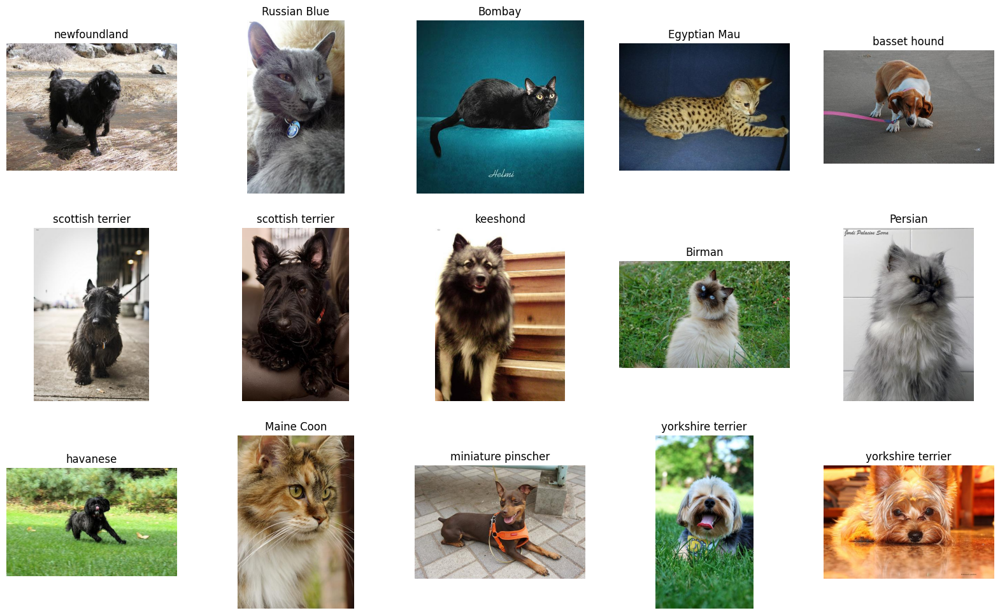

In [ ]:
def show_samples(ds,rows,cols):
    samples = ds.shuffle().select(np.arange(rows*cols)) # selecting random images
    fig = plt.figure(figsize=(cols*4,rows*4))
    # plotting
    for i in range(rows*cols):
        img_bytes = samples[i]['image']['bytes']
        img = Image.open(io.BytesIO(img_bytes))
        label = samples[i]['label']
        fig.add_subplot(rows,cols,i+1)
        plt.imshow(img)
        plt.title(label)
        plt.axis('off')

show_samples(dataset['train'],rows=3,cols=5)

## Preprocessing our dataset
---

When it comes to image datasets, preprocessing involves multiple steps. This includes transforms such as resizing all images to have the same dimensions, normalizing, and scaling the pixel values to a uniform range. We can also add augmentations to our images like random flips, rotations, perspectives, etc.

Before we apply our transforms, let's split our dataset into 3 parts for training, validation  and a hidden test set to evaluate how our model performs. We can use the in-built `train_test_split` method to do so.

Since we only have a `train` split in our original dataset, we'll use 80% of it for training and 10% for `validation` and remaining 10% as our `test` split.

In [ ]:
split_dataset = dataset['train'].train_test_split(test_size=0.2) # 80% train, 20% evaluation
eval_dataset = split_dataset['test'].train_test_split(test_size=0.5) # 50% validation, 50% test

# recombining the splits using a DatasetDict

our_dataset = DatasetDict({
    'train': split_dataset['train'],
    'validation': eval_dataset['train'],
    'test': eval_dataset['test']
})

our_dataset

DatasetDict({
    train: Dataset({
        features: ['path', 'label', 'dog', 'image'],
        num_rows: 5912
    })
    validation: Dataset({
        features: ['path', 'label', 'dog', 'image'],
        num_rows: 739
    })
    test: Dataset({
        features: ['path', 'label', 'dog', 'image'],
        num_rows: 739
    })
})

It is important to note that any model cannot understand the labels in their `string` format. Hence, we map them to their integer counterparts. Since there are 37 labels, the labels will be mapped to a number from 0 to 36.

We'll create two mappings, `label2id` and `id2label` to convert the labels to their IDs and vice versa. This is also be useful when we initialize our model to update its configuration.

In [ ]:
label2id = {c:idx for idx,c in enumerate(labels)}
id2label = {idx:c for idx,c in enumerate(labels)}

### Image Processor

To apply the right transforms on our images, we will be using [AutoImageProcessor](https://huggingface.co/docs/transformers/main_classes/image_processor) which will apply the transforms according to the model we will use. We can check its configuration to see what transforms will be applied.

In [ ]:
processor = AutoImageProcessor.from_pretrained('google/vit-base-patch16-224')
processor

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


ViTImageProcessor {
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

To apply the transforms to a batch at the time of training, we can create a function which will preprocess the batch. The trainer will call this function when we add it to the dataset using `with_transform`.

At the time of training, we need to apply the transforms on a batch of samples. To handle the batches, we'll create a `transforms` function which will take care of the following:

- Converting all images into RGB: It might be possible that some images in your dataset will be grayscale or transparent (RGBA).
- Converting the string labels to integers: using the `label2id` map.
- Applying image transforms: we pass the images through the `processor` to process, and convert them into PyTorch format.

The resultant dataset features will be:
```py
{
    'pixel_values': torch.Tensor,
    'labels': List
}
```

We'll pair the function with our dataset using the `with_transform()` method.

In [ ]:
def transforms(batch):
    batch['image'] = [Image.open(io.BytesIO(x['bytes'])).convert('RGB') for x in batch['image']]
    inputs = processor(batch['image'],return_tensors='pt')
    inputs['labels']=[label2id[y] for y in batch['label']]
    return inputs

In [ ]:
processed_dataset = our_dataset.with_transform(transforms)

#### Data Collation

Batching our data in the correct format is collation. For `pixel_values`, the input shape for the model should be `(batch, channels, height, width)` and for `labels`, the shape should be `(batch,)`

In [ ]:
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['labels'] for x in batch])
    }

## Let's see how to calculate the metrics
---

We can use Hugging Face `evaluate` library to calculate the metrics. For image classification, we can use the accuracy metric.

In [ ]:
accuracy = evaluate.load('accuracy')
def compute_metrics(eval_preds):
    logits, labels = eval_preds
    predictions = np.argmax(logits,axis=1)
    score = accuracy.compute(predictions=predictions, references=labels)
    return score

## Loading our Model
---

We will use [ViTForImageClassification](https://huggingface.co/docs/transformers/main/en/model_doc/vit#transformers.ViTForImageClassification) to load our pre-trained model.

We do need to update the final classification layer, to output predictions equal to the number of labels in our dataset.
We will do that by passing in `num_labels` argument along with our label mappings `id2label` and `label2id`.

We also need to pass `ignore_mismatched_sizes = True` to compensate for the change in number of parameters in the classification layer.

In [ ]:
model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    num_labels = len(labels),
    id2label = id2label,
    label2id = label2id,
    ignore_mismatched_sizes = True
)

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([37]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([37, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


#### Here's the architecture of our model

In [ ]:
model

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTSdpaAttention(
            (attention): ViTSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fe

Since we are not going to update the entire model, we can "freeze" all the parameters except for the new `classifier` layer by setting `requires_grad` to False for each layer's parameters.

In [ ]:
for name,p in model.named_parameters():
    if not name.startswith('classifier'):
        p.requires_grad = False

We can check how many parameters are there in the model along with how many are actually going to be trained now.

In [ ]:
num_params = sum([p.numel() for p in model.parameters()])
trainable_params = sum([p.numel() for p in model.parameters() if p.requires_grad])

print(f"{num_params = :,} | {trainable_params = :,}")

num_params = 85,827,109 | trainable_params = 28,453


# Let's commence our training 🚀️🚀️🚀️
---

We'll be using [Hugging Face Trainer](https://huggingface.co/docs/transformers/main/en/main_classes/trainer) to train our model. Feel free to choose your training arguments such as the batch size, learning rate, number of epochs, logging options, etc.

With respect to image classification, we do need to set `remove_unused_columns=False` to prevent the `image` column in our dataset to be removed, since it is the one being used to create our `pixel_values` inputs.

In [ ]:
training_args = TrainingArguments(
    output_dir="./vit-base-oxford-iiit-pets",
    per_device_train_batch_size=16,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    logging_steps=100,
    num_train_epochs=5,
    learning_rate=3e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=True,
    report_to='tensorboard',
    load_best_model_at_end=True,
)

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=processed_dataset["train"],
    eval_dataset=processed_dataset["validation"],
    tokenizer=processor
)

<ipython-input-23-ad568702bda8>:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,0.353300,0.308662,0.921516
2,0.197700,0.242670,0.926928
3,0.173000,0.222205,0.935047
4,0.160900,0.215186,0.932341
5,0.134500,0.211593,0.935047


TrainOutput(global_step=1850, training_loss=0.30956553716917296, metrics={'train_runtime': 560.0046, 'train_samples_per_second': 52.785, 'train_steps_per_second': 3.304, 'total_flos': 2.2913817801515827e+18, 'train_loss': 0.30956553716917296, 'epoch': 5.0})

### evaluating on our test dataset

In [ ]:
trainer.evaluate(processed_dataset['test'])

{'eval_loss': 0.202137291431427,
 'eval_accuracy': 0.9472259810554804,
 'eval_runtime': 10.8684,
 'eval_samples_per_second': 67.995,
 'eval_steps_per_second': 8.557,
 'epoch': 5.0}

### let's look at some of the predictions made by our new model!

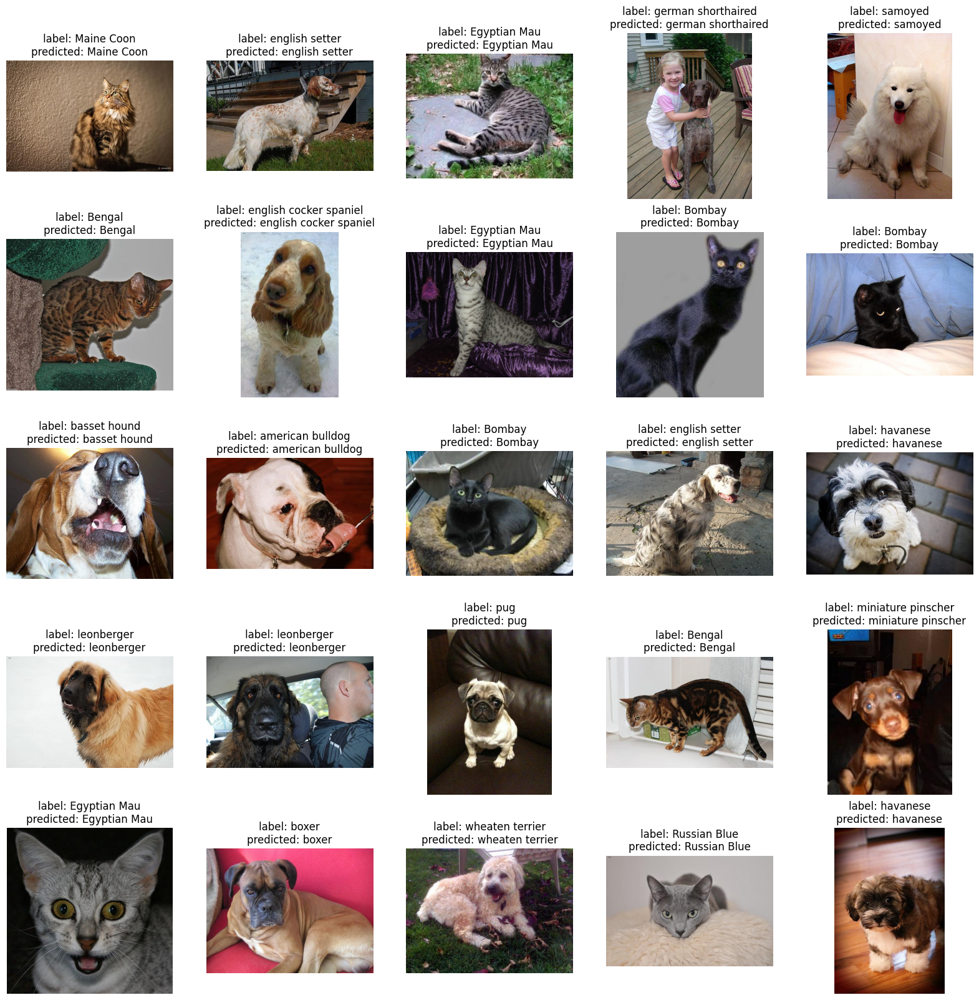

In [ ]:
def show_predictions(rows,cols):
    samples = our_dataset['test'].shuffle().select(np.arange(rows*cols))
    processed_samples = samples.with_transform(transforms)
    predictions = trainer.predict(processed_samples).predictions.argmax(axis=1) # predicted labels from logits
    fig = plt.figure(figsize=(cols*4,rows*4))
    for i in range(rows*cols):
        img_bytes = samples[i]['image']['bytes']
        img = Image.open(io.BytesIO(img_bytes))
        prediction = predictions[i]
        label = f"label: {samples[i]['label']}\npredicted: {id2label[prediction]}"
        fig.add_subplot(rows,cols,i+1)
        plt.imshow(img)
        plt.title(label)
        plt.axis('off')

show_predictions(rows=5,cols=5)

### Our model works really well! Let's save it and also push it to Hugging Face model hub!

In [ ]:
kwargs = {
    "finetuned_from": model.config._name_or_path,
    "dataset": 'pcuenq/oxford-pets',
    "tasks": "image-classification",
    "tags": ['image-classification'],
}

In [ ]:
trainer.save_model()
trainer.push_to_hub('🐕️🐈️', **kwargs)

events.out.tfevents.1735934460.dd93ab21c8fd.1824.1:   0%|          | 0.00/411 [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/ketutsatria/vit-base-oxford-iiit-pets/commit/dfc65f446561e6f83a99ec8efa1e4bbb4c6f4248', commit_message='🐕️🐈️', commit_description='', oid='dfc65f446561e6f83a99ec8efa1e4bbb4c6f4248', pr_url=None, repo_url=RepoUrl('https://huggingface.co/ketutsatria/vit-base-oxford-iiit-pets', endpoint='https://huggingface.co', repo_type='model', repo_id='ketutsatria/vit-base-oxford-iiit-pets'), pr_revision=None, pr_num=None)

###Overview of PyTorch Implementation of Swin


Swin Transformer class
Initialize Parameters. Among various other dropout and normalization parameters, these parameters include:

window_size: Size of the windows for local self-attention.
ape (bool): If True, add absolute position embedding to the patch embedding.
fused_window_process: Optional hardware optimization

Apply Patch Embedding: Similar to ViT, Images are split into non-overlapping patches and linearly embedded using Conv2D.

Apply Positional Embeddings: SwinTransformer optionally uses absolute position embeddings (ape), added to the patch embeddings. Absolute positional embeddings often help the model learn to use positional information about each patch to make more informed predictions.

Apply Depth Decay: Depth decay helps with regularization and preventing overfitting. Depth decay usually done by skipping layers during training. In this Swin implementation, stochastic depth decay is used, which means the deeper the layer, the higher the chance it might be skipped.

Layer Construction:

The model is composed of multiple layers (BasicLayer) of SwinTransformerBlocks, each downsampling the feature map for hierarchical processing using PatchMerging.
The dimensionality of features and resolution of feature maps change across layers.

Classification Head: Similar to ViT, it uses an Multi-Layer Perceptron (MLP) head for classification tasks, as defined in self.head, as the last step

In [ ]:
class SwinTransformer(nn.Module):
    def __init__(
        self,
        img_size=224,
        patch_size=4,
        in_chans=3,
        num_classes=1000,
        embed_dim=96,
        depths=[2, 2, 6, 2],
        num_heads=[3, 6, 12, 24],
        window_size=7,
        mlp_ratio=4.0,
        qkv_bias=True,
        qk_scale=None,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        norm_layer=nn.LayerNorm,
        ape=False,
        patch_norm=True,
        use_checkpoint=False,
        fused_window_process=False,
        **kwargs,
    ):
        super().__init__()

        self.num_classes = num_classes
        self.num_layers = len(depths)
        self.embed_dim = embed_dim
        self.ape = ape
        self.patch_norm = patch_norm
        self.num_features = int(embed_dim * 2 ** (self.num_layers - 1))
        self.mlp_ratio = mlp_ratio

        # split image into non-overlapping patches
        self.patch_embed = PatchEmbed(
            img_size=img_size,
            patch_size=patch_size,
            in_chans=in_chans,
            embed_dim=embed_dim,
            norm_layer=norm_layer if self.patch_norm else None,
        )
        num_patches = self.patch_embed.num_patches
        patches_resolution = self.patch_embed.patches_resolution
        self.patches_resolution = patches_resolution

        # absolute position embedding
        if self.ape:
            self.absolute_pos_embed = nn.Parameter(torch.zeros(1, num_patches, embed_dim))
            trunc_normal_(self.absolute_pos_embed, std=0.02)

        self.pos_drop = nn.Dropout(p=drop_rate)

        # stochastic depth
        dpr = [
            x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))
        ]  # stochastic depth decay rule

        # build layers
        self.layers = nn.ModuleList()
        for i_layer in range(self.num_layers):
            layer = BasicLayer(
                dim=int(embed_dim * 2**i_layer),
                input_resolution=(
                    patches_resolution[0] // (2**i_layer),
                    patches_resolution[1] // (2**i_layer),
                ),
                depth=depths[i_layer],
                num_heads=num_heads[i_layer],
                window_size=window_size,
                mlp_ratio=self.mlp_ratio,
                qkv_bias=qkv_bias,
                qk_scale=qk_scale,
                drop=drop_rate,
                attn_drop=attn_drop_rate,
                drop_path=dpr[sum(depths[:i_layer]) : sum(depths[: i_layer + 1])],
                norm_layer=norm_layer,
                downsample=PatchMerging if (i_layer < self.num_layers - 1) else None,
                use_checkpoint=use_checkpoint,
                fused_window_process=fused_window_process,
            )
            self.layers.append(layer)

        self.norm = norm_layer(self.num_features)
        self.avgpool = nn.AdaptiveAvgPool1d(1)
        self.head = (
            nn.Linear(self.num_features, num_classes)
            if num_classes > 0
            else nn.Identity()
        )

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=0.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)

    @torch.jit.ignore
    def no_weight_decay(self):
        return {"absolute_pos_embed"}

    @torch.jit.ignore
    def no_weight_decay_keywords(self):
        return {"relative_position_bias_table"}

    def forward_features(self, x):
        x = self.patch_embed(x)
        if self.ape:
            x = x + self.absolute_pos_embed
        x = self.pos_drop(x)

        for layer in self.layers:
            x = layer(x)

        x = self.norm(x)  # B L C
        x = self.avgpool(x.transpose(1, 2))  # B C 1
        x = torch.flatten(x, 1)
        return x

    def forward(self, x):
        x = self.forward_features(x)
        x = self.head(x)
        return x

### Swin Transformer Block

The SwinTransformerBlock encapsulates the core operations of the Swin Transformer: local windowed attention and subsequent MLP processing. It plays a key role in enabling the Swin Transformer to efficiently handle large images by focusing on local patches while maintaining the ability to learn global representations.

Layer Components:

Normalization Layer 1 (self.norm1): Applied before the attention mechanism.

Window Attention (self.attn): Computes self-attention within local windows.

Drop Path (self.drop_path): Implements stochastic depth for regularization.

Normalization Layer 2 (self.norm2): Applied before the MLP layer.

MLP (mlp): A multi-layer perceptron for processing features post-attention.

Attention Mask (self.register_buffer): The attention mask is used during the

self-attention computation to control which elements in the windowed input are allowed to interact (i.e., attend to each other). The shifted window approach helps the model to capture broader contextual information by allowing some cross-window interaction.

Swin Transformer Block’s Initialization


In [ ]:
class SwinTransformerBlock(nn.Module):
    r"""Swin Transformer Block.

    Args:
        dim (int): Number of input channels.
        input_resolution (tuple[int]): Input resulotion.
        num_heads (int): Number of attention heads.
        window_size (int): Window size.
        shift_size (int): Shift size for SW-MSA.
        mlp_ratio (float): Ratio of mlp hidden dim to embedding dim.
        qkv_bias (bool, optional): If True, add a learnable bias to query, key, value. Default: True
        qk_scale (float | None, optional): Override default qk scale of head_dim ** -0.5 if set.
        drop (float, optional): Dropout rate. Default: 0.0
        attn_drop (float, optional): Attention dropout rate. Default: 0.0
        drop_path (float, optional): Stochastic depth rate. Default: 0.0
        act_layer (nn.Module, optional): Activation layer. Default: nn.GELU
        norm_layer (nn.Module, optional): Normalization layer.  Default: nn.LayerNorm
        fused_window_process (bool, optional): If True, use one kernel to fused window shift & window partition for acceleration, similar for the reversed part. Default: False
    """

    def __init__(
        self,
        dim,
        input_resolution,
        num_heads,
        window_size=7,
        shift_size=0,
        mlp_ratio=4.0,
        qkv_bias=True,
        qk_scale=None,
        drop=0.0,
        attn_drop=0.0,
        drop_path=0.0,
        act_layer=nn.GELU,
        norm_layer=nn.LayerNorm,
        fused_window_process=False,
    ):
        super().__init__()
        self.dim = dim
        self.input_resolution = input_resolution
        self.num_heads = num_heads
        self.window_size = window_size
        self.shift_size = shift_size
        self.mlp_ratio = mlp_ratio
        if min(self.input_resolution) <= self.window_size:
            # if window size is larger than input resolution, we don't partition windows
            self.shift_size = 0
            self.window_size = min(self.input_resolution)
        assert 0 <= self.shift_size < self.window_size, "shift_size must in 0-window_size"

        self.norm1 = norm_layer(dim)
        self.attn = WindowAttention(
            dim,
            window_size=to_2tuple(self.window_size),
            num_heads=num_heads,
            qkv_bias=qkv_bias,
            qk_scale=qk_scale,
            attn_drop=attn_drop,
            proj_drop=drop,
        )

        self.drop_path = DropPath(drop_path) if drop_path > 0.0 else nn.Identity()
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = Mlp(
            in_features=dim,
            hidden_features=mlp_hidden_dim,
            act_layer=act_layer,
            drop=drop,
        )

        if self.shift_size > 0:
            # calculate attention mask for SW-MSA
            H, W = self.input_resolution
            img_mask = torch.zeros((1, H, W, 1))  # 1 H W 1
            h_slices = (
                slice(0, -self.window_size),
                slice(-self.window_size, -self.shift_size),
                slice(-self.shift_size, None),
            )
            w_slices = (
                slice(0, -self.window_size),
                slice(-self.window_size, -self.shift_size),
                slice(-self.shift_size, None),
            )
            cnt = 0
            for h in h_slices:
                for w in w_slices:
                    img_mask[:, h, w, :] = cnt
                    cnt += 1

            mask_windows = window_partition(
                img_mask, self.window_size
            )  # nW, window_size, window_size, 1
            mask_windows = mask_windows.view(-1, self.window_size * self.window_size)
            attn_mask = mask_windows.unsqueeze(1) - mask_windows.unsqueeze(2)
            attn_mask = attn_mask.masked_fill(attn_mask != 0, float(-100.0)).masked_fill(
                attn_mask == 0, float(0.0)
            )
        else:
            attn_mask = None

        self.register_buffer("attn_mask", attn_mask)
        self.fused_window_process = fused_window_process

    ### New cell ###
    def forward(self, x):
        H, W = self.input_resolution
        B, L, C = x.shape
        assert L == H * W, "input feature has wrong size"

        shortcut = x
        x = self.norm1(x)
        x = x.view(B, H, W, C)

        # cyclic shift
        if self.shift_size > 0:
            if not self.fused_window_process:
                shifted_x = torch.roll(
                    x, shifts=(-self.shift_size, -self.shift_size), dims=(1, 2)
                )
                # partition windows
                x_windows = window_partition(
                    shifted_x, self.window_size
                )  # nW*B, window_size, window_size, C
            else:
                x_windows = WindowProcess.apply(
                    x, B, H, W, C, -self.shift_size, self.window_size
                )
        else:
            shifted_x = x
            # partition windows
            x_windows = window_partition(
                shifted_x, self.window_size
            )  # nW*B, window_size, window_size, C

        x_windows = x_windows.view(
            -1, self.window_size * self.window_size, C
        )  # nW*B, window_size*window_size, C

        # W-MSA/SW-MSA
        attn_windows = self.attn(
            x_windows, mask=self.attn_mask
        )  # nW*B, window_size*window_size, C

        # merge windows
        attn_windows = attn_windows.view(-1, self.window_size, self.window_size, C)

        # reverse cyclic shift
        if self.shift_size > 0:
            if not self.fused_window_process:
                shifted_x = window_reverse(
                    attn_windows, self.window_size, H, W
                )  # B H' W' C
                x = torch.roll(
                    shifted_x, shifts=(self.shift_size, self.shift_size), dims=(1, 2)
                )
            else:
                x = WindowProcessReverse.apply(
                    attn_windows, B, H, W, C, self.shift_size, self.window_size
                )
        else:
            shifted_x = window_reverse(attn_windows, self.window_size, H, W)  # B H' W' C
            x = shifted_x
        x = x.view(B, H * W, C)
        x = shortcut + self.drop_path(x)

        # Feed-forward network (FFN)
        x = x + self.drop_path(self.mlp(self.norm2(x)))

        return x

Swin Transformer Block’s Forward Pass
There are 4 key steps:

Cyclic shift: The feature map is partitioned into windows via window_partition. A cyclic shift is then applied to the partitions. Cyclic shift is done by moving elements (in this case, partitions) in a sequence to the left or right, and wrapping around the elements that go off one end back to the other end. This process changes the positions of the elements relative to each other but keeps the sequence otherwise intact. For example, if you cyclically shift the sequence A, B, C, D to the right by one position, it becomes D, A, B, C.

Cyclic shift allows the model to capture relationships between adjacent windows, enhancing its ability to learn spatial contexts beyond the local scope of individual windows.

Windowed attention: Perform attention using window-based multi-head self attention (W-MSA) module

Merge Patches: Patches are merged via PatchMerging

Reverse cyclic shift: After attention is done, the window partitioning is undone via reverse_window, and the cyclic shift operation is reversed, so that the feature map retains its original form.

In [ ]:
class WindowAttention(nn.Module):
    """
    Args:
        dim (int): Number of input channels.
        window_size (tuple[int]): The height and width of the window.
        num_heads (int): Number of attention heads.
        qkv_bias (bool, optional):  If True, add a learnable bias to query, key, value. Default: True
        qk_scale (float | None, optional): Override default qk scale of head_dim ** -0.5 if set
        attn_drop (float, optional): Dropout ratio of attention weight. Default: 0.0
        proj_drop (float, optional): Dropout ratio of output. Default: 0.0
    """

    def __init__(
        self,
        dim,
        window_size,
        num_heads,
        qkv_bias=True,
        qk_scale=None,
        attn_drop=0.0,
        proj_drop=0.0,
    ):

        super().__init__()
        self.dim = dim
        self.window_size = window_size  # Wh, Ww
        self.num_heads = num_heads
        head_dim = dim // num_heads
        self.scale = qk_scale or head_dim**-0.5

        # define a parameter table of relative position bias
        self.relative_position_bias_table = nn.Parameter(
            torch.zeros((2 * window_size[0] - 1) * (2 * window_size[1] - 1), num_heads)
        )  # 2*Wh-1 * 2*Ww-1, nH

        # get pair-wise relative position index for each token inside the window
        coords_h = torch.arange(self.window_size[0])
        coords_w = torch.arange(self.window_size[1])
        coords = torch.stack(torch.meshgrid([coords_h, coords_w]))  # 2, Wh, Ww
        coords_flatten = torch.flatten(coords, 1)  # 2, Wh*Ww
        relative_coords = (
            coords_flatten[:, :, None] - coords_flatten[:, None, :]
        )  # 2, Wh*Ww, Wh*Ww
        relative_coords = relative_coords.permute(1, 2, 0).contiguous()  # Wh*Ww, Wh*Ww, 2
        relative_coords[:, :, 0] += self.window_size[0] - 1  # shift to start from 0
        relative_coords[:, :, 1] += self.window_size[1] - 1
        relative_coords[:, :, 0] *= 2 * self.window_size[1] - 1
        relative_position_index = relative_coords.sum(-1)  # Wh*Ww, Wh*Ww
        self.register_buffer("relative_position_index", relative_position_index)

        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)

        trunc_normal_(self.relative_position_bias_table, std=0.02)
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x, mask=None):
        """
        Args:
            x: input features with shape of (num_windows*B, N, C)
            mask: (0/-inf) mask with shape of (num_windows, Wh*Ww, Wh*Ww) or None
        """
        B_, N, C = x.shape
        qkv = (
            self.qkv(x)
            .reshape(B_, N, 3, self.num_heads, C // self.num_heads)
            .permute(2, 0, 3, 1, 4)
        )
        q, k, v = (
            qkv[0],
            qkv[1],
            qkv[2],
        )  # make torchscript happy (cannot use tensor as tuple)

        q = q * self.scale
        attn = q @ k.transpose(-2, -1)

        relative_position_bias = self.relative_position_bias_table[
            self.relative_position_index.view(-1)
        ].view(
            self.window_size[0] * self.window_size[1],
            self.window_size[0] * self.window_size[1],
            -1,
        )  # Wh*Ww,Wh*Ww,nH
        relative_position_bias = relative_position_bias.permute(
            2, 0, 1
        ).contiguous()  # nH, Wh*Ww, Wh*Ww
        attn = attn + relative_position_bias.unsqueeze(0)

        if mask is not None:
            nW = mask.shape[0]
            attn = attn.view(B_ // nW, nW, self.num_heads, N, N) + mask.unsqueeze(
                1
            ).unsqueeze(0)
            attn = attn.view(-1, self.num_heads, N, N)
            attn = self.softmax(attn)
        else:
            attn = self.softmax(attn)

        attn = self.attn_drop(attn)

        x = (attn @ v).transpose(1, 2).reshape(B_, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x

**Window Attention**

WindowAttention is a window-based multi-head self attention (W-MSA) module with relative position bias. This can be used for both shifted and non-shifted windows.

In [ ]:
class PatchMerging(nn.Module):
    r"""Patch Merging Layer.

    Args:
        input_resolution (tuple[int]): Resolution of input feature.
        dim (int): Number of input channels.
        norm_layer (nn.Module, optional): Normalization layer.  Default: nn.LayerNorm
    """

    def __init__(self, input_resolution, dim, norm_layer=nn.LayerNorm):
        super().__init__()
        self.input_resolution = input_resolution
        self.dim = dim
        self.reduction = nn.Linear(4 * dim, 2 * dim, bias=False)
        self.norm = norm_layer(4 * dim)

    def forward(self, x):
        """
        x: B, H*W, C
        """
        H, W = self.input_resolution
        B, L, C = x.shape
        assert L == H * W, "input feature has wrong size"
        assert H % 2 == 0 and W % 2 == 0, f"x size ({H}*{W}) are not even."

        x = x.view(B, H, W, C)

        x0 = x[:, 0::2, 0::2, :]  # B H/2 W/2 C
        x1 = x[:, 1::2, 0::2, :]  # B H/2 W/2 C
        x2 = x[:, 0::2, 1::2, :]  # B H/2 W/2 C
        x3 = x[:, 1::2, 1::2, :]  # B H/2 W/2 C
        x = torch.cat([x0, x1, x2, x3], -1)  # B H/2 W/2 4*C
        x = x.view(B, -1, 4 * C)  # B H/2*W/2 4*C

        x = self.norm(x)
        x = self.reduction(x)

        return x

**Patch Merging Layer**

Patch merging method is used for downsampling. It is used to reduce the spatial dimensions of the feature map, similar to pooling in traditional convolutional neural networks (CNNs). It helps in building hierarchical feature representations by progressively increasing the receptive field and reducing the spatial resolution.

In [ ]:
from datasets import load_dataset
from transformers import AutoImageProcessor, SwinForImageClassification
import torch

model = SwinForImageClassification.from_pretrained(
    "microsoft/swin-tiny-patch4-window7-224"
)
image_processor = AutoImageProcessor.from_pretrained(
    "microsoft/swin-tiny-patch4-window7-224"
)

dataset = load_dataset("huggingface/cats-image")
image = dataset["test"]["image"][0]

inputs = image_processor(image, return_tensors="pt")

with torch.no_grad():
    logits = model(**inputs).logits

predicted_label_id = logits.argmax(-1).item()
predicted_label_text = model.config.id2label[predicted_label_id]

print(predicted_label_text)

config.json:   0%|          | 0.00/71.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/113M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/255 [00:00<?, ?B/s]

cats-image.py:   0%|          | 0.00/2.56k [00:00<?, ?B/s]

The repository for huggingface/cats-image contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/huggingface/cats-image.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N] y


Generating test split: 0 examples [00:00, ? examples/s]

**Usage of pretrained Swin model for classification**

Here is how to use Swin model to classify a cat image into one of the 1,000 ImageNet classes:

In [ ]:
from datasets import load_dataset
from transformers import AutoImageProcessor, SwinForImageClassification
import torch

model = SwinForImageClassification.from_pretrained(
    "microsoft/swin-tiny-patch4-window7-224"
)
image_processor = AutoImageProcessor.from_pretrained(
    "microsoft/swin-tiny-patch4-window7-224"
)

dataset = load_dataset("huggingface/cats-image")
image = dataset["test"]["image"][0]

inputs = image_processor(image, return_tensors="pt")

with torch.no_grad():
    logits = model(**inputs).logits

predicted_label_id = logits.argmax(-1).item()
predicted_label_text = model.config.id2label[predicted_label_id]

print(predicted_label_text)

**Convolutional Vision Transformer (CvT)**

**PyTorch Implementation**

Time to get hands-on! Let’s explore how to code each major blocks of the CvT architecture in PyTorch shown in the official implementation [8].

**1. Importing required libraries**

In [ ]:
from collections import OrderedDict
import torch
import torch.nn as nn
import torch.nn.functional as F
from einops import rearrange
from einops.layers.torch import Rearrange

**2. Implementation of Convolutional Projection.**

In [ ]:
def _build_projection(self, dim_in, dim_out, kernel_size, padding, stride, method):
    if method == "dw_bn":
        proj = nn.Sequential(
            OrderedDict(
                [
                    (
                        "conv",
                        nn.Conv2d(
                            dim_in,
                            dim_in,
                            kernel_size=kernel_size,
                            padding=padding,
                            stride=stride,
                            bias=False,
                            groups=dim_in,
                        ),
                    ),
                    ("bn", nn.BatchNorm2d(dim_in)),
                    ("rearrage", Rearrange("b c h w -> b (h w) c")),
                ]
            )
        )
    elif method == "avg":
        proj = nn.Sequential(
            OrderedDict(
                [
                    (
                        "avg",
                        nn.AvgPool2d(
                            kernel_size=kernel_size,
                            padding=padding,
                            stride=stride,
                            ceil_mode=True,
                        ),
                    ),
                    ("rearrage", Rearrange("b c h w -> b (h w) c")),
                ]
            )
        )
    elif method == "linear":
        proj = None
    else:
        raise ValueError("Unknown method ({})".format(method))

    return proj

The method takes several parameters related to a convolutional layer (such as input and output dimensions, kernel size, padding, stride, and method) and returns a projection block based on the specified method.

If the method is dw_bn (depthwise separable with batch normalization), it creates a Sequential block consisting of a depthwise separable convolutional layer followed by batch normalization and rearranges the dimensions.

If the method is avg (average pooling), it creates a Sequential block with an average pooling layer followed by rearranging the dimensions.

If the method is linear, it returns None, indicating that no projection is applied.

The rearrangement of dimensions is performed using the Rearrange operation, which reshapes the input tensor. The resulting projection block is then returned.

**3. Implementation of Convolutional Token Embedding**

In [ ]:
class ConvEmbed(nn.Module):
    def __init__(
        self, patch_size=7, in_chans=3, embed_dim=64, stride=4, padding=2, norm_layer=None
    ):
        super().__init__()
        patch_size = to_2tuple(patch_size)
        self.patch_size = patch_size

        self.proj = nn.Conv2d(
            in_chans, embed_dim, kernel_size=patch_size, stride=stride, padding=padding
        )
        self.norm = norm_layer(embed_dim) if norm_layer else None

    def forward(self, x):
        x = self.proj(x)

        B, C, H, W = x.shape
        x = rearrange(x, "b c h w -> b (h w) c")
        if self.norm:
            x = self.norm(x)
        x = rearrange(x, "b (h w) c -> b c h w", h=H, w=W)

        return x

This code defines a ConvEmbed module that performs patch-wise embedding on an input image.

The __init__ method initializes the module with parameters such as patch_size (size of the image patches), in_chans (number of input channels), embed_dim (dimensionality of the embedded patches), stride (stride for the convolution operation), padding (padding for the convolution operation), and norm_layer (a normalization layer, which is optional).

In the constructor, a 2D convolutional layer (nn.Conv2d) is created with specified parameters, including the patch size, input channels, embedding dimension, stride, and padding. This convolutional layer is assigned to self.proj.

If a normalization layer is provided, an instance of the normalization layer is created with embed_dim channels, and it is assigned to self.norm.

The forward method takes an input tensor x and applies the convolution operation using self.proj. The output is reshaped using the rearrange function to flatten the spatial dimensions. If a normalization layer is present, it is applied to the flattened representation. Finally, the tensor is reshaped back to the original spatial dimensions and returned.

In summary, this module is designed for patch-wise embedding of images, where each patch is processed independently through a convolutional layer, and optional normalization is applied to the embedded features.

**4. Implementation of Vision Transformer Block**

In [ ]:
class VisionTransformer(nn.Module):
    """Vision Transformer with support for patch or hybrid CNN input stage"""

    def __init__(
        self,
        patch_size=16,
        patch_stride=16,
        patch_padding=0,
        in_chans=3,
        embed_dim=768,
        depth=12,
        num_heads=12,
        mlp_ratio=4.0,
        qkv_bias=False,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.0,
        act_layer=nn.GELU,
        norm_layer=nn.LayerNorm,
        init="trunc_norm",
        **kwargs,
    ):
        super().__init__()
        self.num_features = self.embed_dim = embed_dim

        self.rearrage = None

        self.patch_embed = ConvEmbed(
            patch_size=patch_size,
            in_chans=in_chans,
            stride=patch_stride,
            padding=patch_padding,
            embed_dim=embed_dim,
            norm_layer=norm_layer,
        )

        with_cls_token = kwargs["with_cls_token"]
        if with_cls_token:
            self.cls_token = nn.Parameter(torch.zeros(1, 1, embed_dim))
        else:
            self.cls_token = None

        self.pos_drop = nn.Dropout(p=drop_rate)
        dpr = [
            x.item() for x in torch.linspace(0, drop_path_rate, depth)
        ]  # stochastic depth decay rule

        blocks = []
        for j in range(depth):
            blocks.append(
                Block(
                    dim_in=embed_dim,
                    dim_out=embed_dim,
                    num_heads=num_heads,
                    mlp_ratio=mlp_ratio,
                    qkv_bias=qkv_bias,
                    drop=drop_rate,
                    attn_drop=attn_drop_rate,
                    drop_path=dpr[j],
                    act_layer=act_layer,
                    norm_layer=norm_layer,
                    **kwargs,
                )
            )
        self.blocks = nn.ModuleList(blocks)

        if self.cls_token is not None:
            trunc_normal_(self.cls_token, std=0.02)

        if init == "xavier":
            self.apply(self._init_weights_xavier)
        else:
            self.apply(self._init_weights_trunc_normal)

        def forward(self, x):
            x = self.patch_embed(x)
            B, C, H, W = x.size()

            x = rearrange(x, "b c h w -> b (h w) c")

            cls_tokens = None
            if self.cls_token is not None:
                cls_tokens = self.cls_token.expand(B, -1, -1)
                x = torch.cat((cls_tokens, x), dim=1)

            x = self.pos_drop(x)

            for i, blk in enumerate(self.blocks):
                x = blk(x, H, W)

            if self.cls_token is not None:
                cls_tokens, x = torch.split(x, [1, H * W], 1)
            x = rearrange(x, "b (h w) c -> b c h w", h=H, w=W)

            return x, cls_tokens

This code defines a Vision Transformer module. Here’s a brief overview of the code:

Initialization: The VisionTransformer class is initialized with various parameters that define the model architecture, such as patch size, embedding dimensions, number of layers, number of attention heads, dropout rates, etc.

Patch Embedding: The model includes a patch embedding layer (`patch_embed), which processes the input image by dividing it into non-overlapping patches and embedding them using Convolutions.

Transformer Blocks: The model consists of a stack of transformer blocks (Block). The number of blocks is determined by the depth parameter. Each block contains multi-head self-attention mechanisms and a feedforward neural network.

Classification Token: Optionally, the model can include a learnable classification token (cls_token) appended to the input sequence. This token is used for classification tasks.

Stochastic Depth: Stochastic depth is applied to the transformer blocks, where a random subset of blocks is skipped during training to improve regularization. This is controlled by the drop_path_rate parameter.

Initialization of Weights: The model weights are initialized using either truncated normal distribution (trunc_norm) or Xavier initialization (xavier).

Forward Method: The forward method processes the input through the patch embedding, rearranges the dimensions, adds the classification token if present, applies dropout, and then passes the data through the stack of transformer blocks. Finally, the output is rearranged back to the original shape, and the classification token (if present) is separated from the rest of the sequence before returning the output.



**5. Implementation of Convolutional Vision Transformer Block (Hierarchy of Transformers)**

In [ ]:
class ConvolutionalVisionTransformer(nn.Module):
    def __init__(
        self,
        in_chans=3,
        num_classes=1000,
        act_layer=nn.GELU,
        norm_layer=nn.LayerNorm,
        init="trunc_norm",
        spec=None,
    ):
        super().__init__()
        self.num_classes = num_classes

        self.num_stages = spec["NUM_STAGES"]
        for i in range(self.num_stages):
            kwargs = {
                "patch_size": spec["PATCH_SIZE"][i],
                "patch_stride": spec["PATCH_STRIDE"][i],
                "patch_padding": spec["PATCH_PADDING"][i],
                "embed_dim": spec["DIM_EMBED"][i],
                "depth": spec["DEPTH"][i],
                "num_heads": spec["NUM_HEADS"][i],
                "mlp_ratio": spec["MLP_RATIO"][i],
                "qkv_bias": spec["QKV_BIAS"][i],
                "drop_rate": spec["DROP_RATE"][i],
                "attn_drop_rate": spec["ATTN_DROP_RATE"][i],
                "drop_path_rate": spec["DROP_PATH_RATE"][i],
                "with_cls_token": spec["CLS_TOKEN"][i],
                "method": spec["QKV_PROJ_METHOD"][i],
                "kernel_size": spec["KERNEL_QKV"][i],
                "padding_q": spec["PADDING_Q"][i],
                "padding_kv": spec["PADDING_KV"][i],
                "stride_kv": spec["STRIDE_KV"][i],
                "stride_q": spec["STRIDE_Q"][i],
            }

            stage = VisionTransformer(
                in_chans=in_chans,
                init=init,
                act_layer=act_layer,
                norm_layer=norm_layer,
                **kwargs,
            )
            setattr(self, f"stage{i}", stage)

            in_chans = spec["DIM_EMBED"][i]

        dim_embed = spec["DIM_EMBED"][-1]
        self.norm = norm_layer(dim_embed)
        self.cls_token = spec["CLS_TOKEN"][-1]

        # Classifier head
        self.head = (
            nn.Linear(dim_embed, num_classes) if num_classes > 0 else nn.Identity()
        )
        trunc_normal_(self.head.weight, std=0.02)

    def forward_features(self, x):
        for i in range(self.num_stages):
            x, cls_tokens = getattr(self, f"stage{i}")(x)

        if self.cls_token:
            x = self.norm(cls_tokens)
            x = torch.squeeze(x)
        else:
            x = rearrange(x, "b c h w -> b (h w) c")
            x = self.norm(x)
            x = torch.mean(x, dim=1)

        return x

    def forward(self, x):
        x = self.forward_features(x)
        x = self.head(x)

        return x

This code defines a PyTorch module called ConvolutionalVisionTransformer.

The model consists of multiple stages, each represented by an instance of the VisionTransformer class.
Each stage has different configurations such as patch size, stride, depth, number of heads, etc., specified in the spec dictionary.
The forward_features method processes the input x through all the stages, and it aggregates the final representation.
The class has a classifier head that performs a linear transformation to produce the final output.
The forward method calls forward_features and then passes the result through the classifier head.
The vision transformer stages are sequentially named as stage0, stage1, etc., and each stage is an instance of the VisionTransformer class forming a hierarchy of transformers.

In [ ]:
pip install transformers

In [ ]:
from transformers import AutoFeatureExtractor, CvtForImageClassification
from PIL import Image
import requests

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/cvt-13")
model = CvtForImageClassification.from_pretrained("microsoft/cvt-13")

inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits
# model predicts one of the 1000 ImageNet classes
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])

preprocessor_config.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/convnext/feature_extraction_convnext.py:28: FutureWarning: The class ConvNextFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ConvNextImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/70.3k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/80.2M [00:00<?, ?B/s]

### **Dilated Neighborhood Attention Transformer (DINAT)**

The Dilated Neighborhood Attention Transformer (DiNAT) is an innovative hierarchical vision transformer designed to enhance the performance of deep learning models, particularly in visual recognition tasks. Unlike traditional transformers, which employ self-attention mechanisms that may become computationally expensive as models scale, DiNAT introduces Dilated Neighborhood Attention (DiNA). DiNA extends a local attention mechanism called Neighborhood Attention (NA) by incorporating sparse global attention without additional computational overhead. This extension allows DiNA to capture more global context, expand the receptive field exponentially, and model longer-range inter-dependencies efficiently.

DiNAT combines both NA and DiNA in its architecture, resulting in a transformer model capable of preserving locality, maintaining translational equivariance, and achieving significant performance boosts in downstream vision tasks. The experiments conducted with DiNAT demonstrate its superiority over strong baseline models such as NAT, Swin, and ConvNeXt across various visual recognition tasks.



**Image Classification with DiNAT**

In [ ]:
pip install transformers torch pillow requests


In [ ]:
!apt-get update

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,197 kB]
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,632 kB]
Fetched 4,225 kB in 4s (1,196 kB/s)
Reading pack

In [ ]:
!apt-get install -y build-essential cmake


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
build-essential is already the newest version (12.9ubuntu3).
cmake is already the newest version (3.22.1-1ubuntu1.22.04.2).
0 upgraded, 0 newly installed, 0 to remove and 54 not upgraded.


In [ ]:
!pip install --upgrade pip setuptools wheel


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 56.6 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 75.1.0
    Uninstalling setuptools-75.1.0:
      Successfully uninstalled setuptools-75.1.0
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


In [ ]:
!pip install natten --force-reinstall


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 21.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.4/906.4 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 6.8 MB/s eta 0:00:00


In [ ]:
from transformers import AutoImageProcessor, DinatForImageClassification
from PIL import Image
import requests

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

feature_extractor = AutoImageProcessor.from_pretrained("shi-labs/dinat-small-in1k-224")
model = DinatForImageClassification.from_pretrained("shi-labs/dinat-small-in1k-224")

inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits
# model predicts one of the 1000 ImageNet classes
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/70.1k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/203M [00:00<?, ?B/s]

| 2025-01-04 17:25:19,836 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dqkrpb`, which is deprecated in favor of `natten.functional.na2d_qk`. Please consider switching, as this op will be removed soon.
| 2025-01-04 17:25:20,958 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dav`, which is deprecated in favor of `natten.functional.na2d_av`. Please consider switching, as this op will be removed soon.
| 2025-01-04 17:25:21,206 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dqkrpb`, which is deprecated in favor of `natten.functional.na2d_qk`. Please consider switching, as this op will be removed soon.
| 2025-01-04 17:25:22,287 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dav`, which is deprecated in favor of `natten.functional.na2d_av`. Please consider switching, as this op will be removed soon.
| 2025-01-04 17:25:22,

Predicted class: Egyptian cat


**MobileViT v2**

The previously discussed Vision Transformer architectures are computationally intensive and hard to run on mobile devices. The previous state-of-the-art architecture used CNNs for mobile vision tasks. However, CNNs cannot learn global representations, and as a result they perform worse than their transformer counterparts.

The MobileViT architecture aims to solve the required problems for vision mobile tasks, such as low-latency and lightweight architecture, while providing the advantages of transformers and CNNs. The mobileViT Architecture was developed by Apple and builds MobileNet from Google’s research team. The MobileViT architecture builds upon the previous MobileNet architecture by adding the MobileViT Block and separable self-attention. These two features allow for lightning-fast latency, reduction of parameters, computational complexity, and deployment of vision ML models on resource-constrained devices.

**Transformers Library**

If you want to try out MobileViTv2 locally, you can use it from HuggingFace’s transformers library, here’s how:

In [ ]:
pip install transformers

Below is a short snippet on how to use MobileViT model to classify an image.



In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 6.7 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.12.0
    Uninstalling fsspec-2024.12.0:
      Successfully uninstalled fsspec-2024.12.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
from transformers import AutoImageProcessor, MobileViTV2ForImageClassification
from datasets import load_dataset
from PIL import Image

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

image_processor = AutoImageProcessor.from_pretrained(
    "apple/mobilevitv2-1.0-imagenet1k-256"
)
model = MobileViTV2ForImageClassification.from_pretrained(
    "apple/mobilevitv2-1.0-imagenet1k-256"
)

inputs = image_processor(image, return_tensors="pt")

logits = model(**inputs).logits

# model predicts one of the 1000 ImageNet classes
predicted_label = logits.argmax(-1).item()
print(model.config.id2label[predicted_label])

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.8k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/19.8M [00:00<?, ?B/s]

tabby, tabby cat


**Inference API**

For an even lighter computer vision setup, you can use the Hugging Face Inference API with MobileViTv2. Inference API is an API to interact with many models available on Hugging Face Hub. We can query Inference API like following through Python.



In [ ]:
import json
import requests
import os

# Get API_TOKEN from environment variables
API_TOKEN = os.environ.get("HF_API_TOKEN")

headers = {"Authorization": f"Bearer {API_TOKEN}"}
API_URL = (
    "https://api-inference.huggingface.co/models/apple/mobilevitv2-1.0-imagenet1k-256"
)


def query(filename):
    with open(filename, "rb") as f:
        data = f.read()
    response = requests.request("POST", API_URL, headers=headers, data=data)
    return json.loads(response.content.decode("utf-8"))


data = query("cats.jpg")

**Installing Necessary Libraries**

Let’s start with installation. Just execute the below cells to install the necessary packages. For this tutorial, we will be using Hugging Face Transformers and PyTorch.

In [ ]:
!pip install -U -q datasets transformers[torch] evaluate timm albumentations accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.9/274.9 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 22.9 MB/s eta 0:00:00


**Scenario**

To make this tutorial interesting, let’s consider a real-world example. Consider this scenario: construction workers require the utmost safety when working in construction areas. Basic safety protocol requires wearing a helmet every time. Since there are many construction workers, it is hard to keep and eye on everyone every time.

But, if we can have a camera system that can detect persons and whether the person is wearing a helmet or not in real-time, that would be awesome, right?

So, we are going to fine-tune a lightweight object detection model for doing just that. Let’s dive in.

**Dataset**

For the above scenario, we will use the hardhat dataset provided by Northeaster University China. We can download and load this dataset with 🤗 datasets.

In [ ]:
from datasets import load_dataset

dataset = load_dataset("anindya64/hardhat")
dataset

README.md:   0%|          | 0.00/872 [00:00<?, ?B/s]

(…)-00000-of-00001-3e0d95da2811afee.parquet:   0%|          | 0.00/200M [00:00<?, ?B/s]

(…)-00000-of-00001-9fc2e7e45a21ae43.parquet:   0%|          | 0.00/66.9M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5297 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1766 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'width', 'height', 'objects'],
        num_rows: 5297
    })
    test: Dataset({
        features: ['image', 'image_id', 'width', 'height', 'objects'],
        num_rows: 1766
    })
})

Above is a DatasetDict, which is an efficient dict-like structure containing the whole dataset in train and test splits. As you can see, under each split (train and test), we have features and num_rows. Under features, we have the image, a Pillow Object, the id of the image, height and width, and objects. Now let’s see what each datapoint (in train/test set) looks like. To do that, run the following line:

In [ ]:
dataset["train"][0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375>,
 'image_id': 1,
 'width': 500,
 'height': 375,
 'objects': {'id': [1, 1],
  'area': [3068.0, 690.0],
  'bbox': [[178.0, 84.0, 52.0, 59.0], [111.0, 144.0, 23.0, 30.0]],
  'category': ['helmet', 'helmet']}}

As you see, objects is an another dict containing the object ids (which are the class ids here), the area of the objects, and the bounding box coordinates (bbox) and the category (or the label). Here is a more detailed explaination of each of the keys and values of a data element.

image: This is a Pillow Image object that helps to look into the image directly before even loading from the path.
image_id: Denotes which number of images is from the train file.
width: The width of the image.
height: The height of the image.
objects: Another dictionary containing information about annotation. This contains the following:
id: A list, where the length of the list denotes the number of objects and the value of each denotes the class index.
area: The area of the object.
bbox: Denotes bounding box coordinates of the object.
category: The class (string) of the object.

Now let’s properly extract the train and test samples. For this tutorial, we have around 5000 training samples and 1700 test samples.

In [ ]:
# First, extract out the train and test set

train_dataset = dataset["train"]
test_dataset = dataset["test"]

Now that we know what a sample data point contains, let’s start by plotting that sample. Here we are going to first draw the image and then also draw the corresponding bounding box.

Here is what we are going to do:

Get the image and its corresponding height and width.
Make a draw object that can easily draw text and lines on image.
Get the annotations dict from the sample.
Iterate over it.
For each, get the bounding box co-ordinates, which are x (where the bounding box starts horizontally), y (where the bounding box starts vertically), w (width of the bounding box), h (height of the bounding box).
Now if the bounding box measures are normalized then scale it, else leave it.
And finally draw the rectangle and the the class category text.

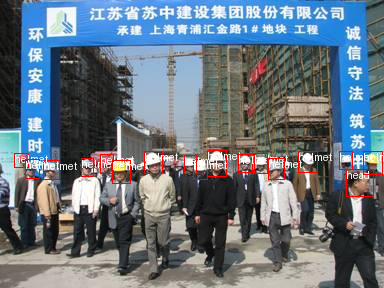

In [ ]:
import numpy as np
from PIL import Image, ImageDraw


def draw_image_from_idx(dataset, idx):
    sample = dataset[idx]
    image = sample["image"]
    annotations = sample["objects"]
    draw = ImageDraw.Draw(image)
    width, height = sample["width"], sample["height"]

    for i in range(len(annotations["id"])):
        box = annotations["bbox"][i]
        class_idx = annotations["id"][i]
        x, y, w, h = tuple(box)
        if max(box) > 1.0:
            x1, y1 = int(x), int(y)
            x2, y2 = int(x + w), int(y + h)
        else:
            x1 = int(x * width)
            y1 = int(y * height)
            x2 = int((x + w) * width)
            y2 = int((y + h) * height)
        draw.rectangle((x1, y1, x2, y2), outline="red", width=1)
        draw.text((x1, y1), annotations["category"][i], fill="white")
    return image


draw_image_from_idx(dataset=train_dataset, idx=10)

We have a function to plot one single image, let’s write a simple function using the above to plot multiple images. This will help us with some analysis.

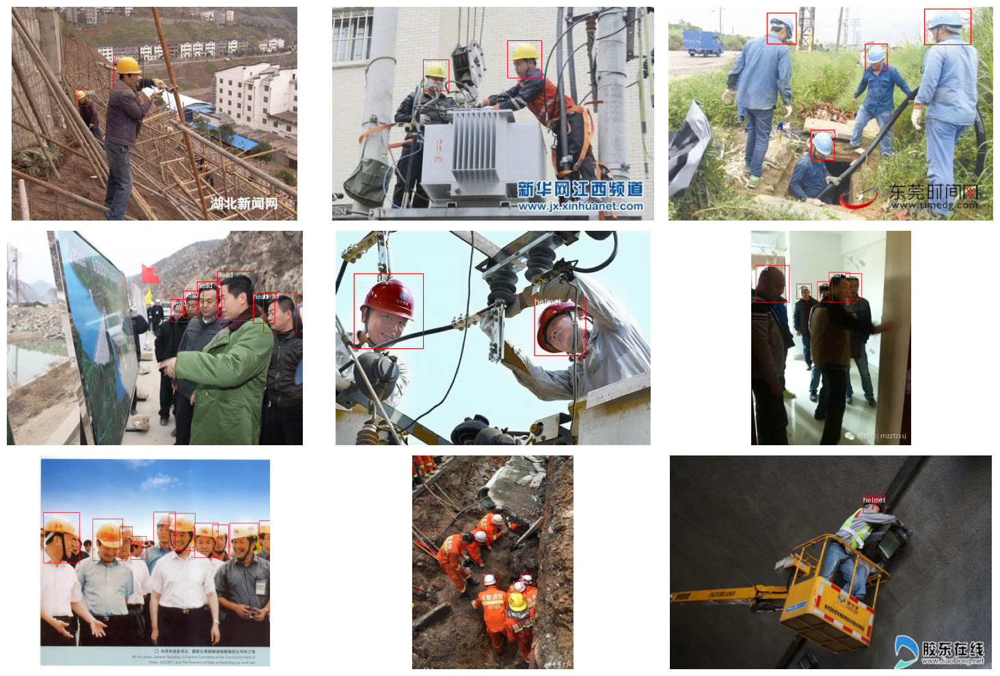

In [ ]:
import matplotlib.pyplot as plt


def plot_images(dataset, indices):
    """
    Plot images and their annotations.
    """
    num_rows = len(indices) // 3
    num_cols = 3
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, idx in enumerate(indices):
        row = i // num_cols
        col = i % num_cols

        # Draw image
        image = draw_image_from_idx(dataset, idx)

        # Display image on the corresponding subplot
        axes[row, col].imshow(image)
        axes[row, col].axis("off")

    plt.tight_layout()
    plt.show()


# Now use the function to plot images

plot_images(train_dataset, range(9))

**AutoImageProcessor**

Before fine-tuning the model, we must preprocess the data in such a way that it matches exactly with the approach used during the time of pre-training. HuggingFace AutoImageProcessor takes care of processing the image data to create pixel_values, pixel_mask, and labels that a DETR model can train with.

Now, let us instantiate the image processor from the same checkpoint we want to use our model to fine-tune.

In [ ]:
from transformers import AutoImageProcessor

checkpoint = "facebook/detr-resnet-50-dc5"
image_processor = AutoImageProcessor.from_pretrained(checkpoint)

preprocessor_config.json:   0%|          | 0.00/274 [00:00<?, ?B/s]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


**Preprocessing the Dataset**

Before passing the images to the image_processor, let’s also apply different types of augmentations to the images along with their corresponding bounding boxes.

In simple terms, augmentations are some set of random transformations like rotations, resizing etc. These are applied to get more samples and to make the vision model more robust towards different conditions of the image. We will use the albumentations library to achieve this. It let’s you to create random transformations of the images so that your sample size increases for training.

In [ ]:
import albumentations
import numpy as np
import torch

transform = albumentations.Compose(
    [
        albumentations.Resize(480, 480),
        albumentations.HorizontalFlip(p=1.0),
        albumentations.RandomBrightnessContrast(p=1.0),
    ],
    bbox_params=albumentations.BboxParams(format="coco", label_fields=["category"]),
)

Once we initialize all the transformations, we need to make a function which formats the annotations and returns the a list of annotation with a very specific format.

This is because the image_processor expects the annotations to be in the following format: {'image_id': int, 'annotations': List[Dict]}, where each dictionary is a COCO object annotation.

In [ ]:
def formatted_anns(image_id, category, area, bbox):
    annotations = []
    for i in range(0, len(category)):
        new_ann = {
            "image_id": image_id,
            "category_id": category[i],
            "isCrowd": 0,
            "area": area[i],
            "bbox": list(bbox[i]),
        }
        annotations.append(new_ann)

    return annotations

Finally, we combine the image and annotation transformations to do transformations over the whole batch of dataset.

Here is the final code to do so:

In [ ]:
# transforming a batch


def transform_aug_ann(examples):
    image_ids = examples["image_id"]
    images, bboxes, area, categories = [], [], [], []
    for image, objects in zip(examples["image"], examples["objects"]):
        image = np.array(image.convert("RGB"))[:, :, ::-1]
        out = transform(image=image, bboxes=objects["bbox"], category=objects["id"])

        area.append(objects["area"])
        images.append(out["image"])
        bboxes.append(out["bboxes"])
        categories.append(out["category"])

    targets = [
        {"image_id": id_, "annotations": formatted_anns(id_, cat_, ar_, box_)}
        for id_, cat_, ar_, box_ in zip(image_ids, categories, area, bboxes)
    ]

    return image_processor(images=images, annotations=targets, return_tensors="pt")

Finally, all you have to do is apply this preprocessing function to the entire dataset.

In [ ]:
# Apply transformations for both train and test dataset

train_dataset_transformed = train_dataset.with_transform(transform_aug_ann)
test_dataset_transformed = test_dataset.with_transform(transform_aug_ann)

Now let’s see how a transformed train dataset sample looks like:



In [ ]:
train_dataset_transformed[0]

{'pixel_values': tensor([[[ 0.6734,  0.6734,  0.6734,  ...,  0.4337,  0.2282,  0.0912],
          [ 0.6734,  0.6734,  0.6563,  ...,  0.4166,  0.2111,  0.0741],
          [ 0.6734,  0.6563,  0.6392,  ...,  0.3994,  0.1939,  0.0569],
          ...,
          [ 0.2111,  0.1083, -0.0458,  ..., -0.1314, -0.1999, -0.2513],
          [ 0.2111,  0.1083, -0.0629,  ..., -0.1486, -0.2342, -0.2856],
          [ 0.2111,  0.1083, -0.0629,  ..., -0.1657, -0.2513, -0.3198]],
 
         [[ 0.7304,  0.7304,  0.7304,  ...,  0.9755,  0.7479,  0.6078],
          [ 0.7304,  0.7304,  0.7304,  ...,  0.9580,  0.7129,  0.5728],
          [ 0.7304,  0.7304,  0.7129,  ...,  0.9230,  0.6779,  0.5203],
          ...,
          [ 0.7479,  0.6254,  0.4328,  ...,  0.2402,  0.1702,  0.1176],
          [ 0.7479,  0.6078,  0.4153,  ...,  0.2227,  0.1352,  0.0826],
          [ 0.7479,  0.6078,  0.3978,  ...,  0.2052,  0.1176,  0.0476]],
 
         [[ 1.0539,  1.0539,  1.0539,  ...,  1.7337,  1.5071,  1.3677],
          [ 

We are almost there 🚀. As a last preprocessing step, we need to write a custom collate_fn. Now what is a collate_fn ?

A collate_fn is responsible for taking a list of samples from a dataset and converting them into a batch suitable for model’s input format.

In general a DataCollator typically performs tasks such as padding, truncating etc. In a custom collate function, we often define what and how we want to group the data into batches or simply, how to represent each batch.

Data collator mainly puts the data together and then preprocesses them. Let’s make our collate function.



In [ ]:
def collate_fn(batch):
    pixel_values = [item["pixel_values"] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item["labels"] for item in batch]
    batch = {}
    batch["pixel_values"] = encoding["pixel_values"]
    batch["pixel_mask"] = encoding["pixel_mask"]
    batch["labels"] = labels
    return batch

**Training a DETR Model.**

The training procedure involves the following steps:

Loading the base (pre-trained) model with AutoModelForObjectDetection using the same checkpoint as in the preprocessing.

Defining all the hyperparameters and additional arguments inside TrainingArguments.

Pass the training arguments inside HuggingFace Trainer, along with the model, dataset and image.

Call the train() method and fine-tune your model.

In [ ]:
from transformers import AutoModelForObjectDetection

id2label = {0: "head", 1: "helmet", 2: "person"}
label2id = {v: k for k, v in id2label.items()}


model = AutoModelForObjectDetection.from_pretrained(
    checkpoint,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)

config.json:   0%|          | 0.00/4.38k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50-dc5 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model check

Before proceeding further, log in to Hugging Face Hub to upload your model on the fly while training. In this way, you do not need to handle the checkpoints and save them somewhere.

In [ ]:
from huggingface_hub import notebook_login

notebook_login



<function huggingface_hub._login.notebook_login(*, new_session: bool = True, write_permission: bool = False) -> None>

Once done, let’s start training the model. We start by defining the training arguments and defining a trainer object that uses those arguments to do the training, as shown here:

In [ ]:
from transformers import TrainingArguments
from transformers import Trainer

# Define the training arguments

training_args = TrainingArguments(
    output_dir="detr-resnet-50-hardhat-finetuned",
    per_device_train_batch_size=8,
    num_train_epochs=3,
    max_steps=1000,
    fp16=True,
    save_steps=10,
    logging_steps=30,
    learning_rate=1e-5,
    weight_decay=1e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=False,
)

# Define the trainer

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    train_dataset=train_dataset_transformed,
    eval_dataset=test_dataset_transformed,
    processing_class=image_processor,
)

trainer.train()

wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: ERROR API key must be 40 characters long, yours was 37


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: ERROR API key must be 40 characters long, yours was 37


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


**Testing and Inference**

Now we will try to do inference of our new fine-tuned model. For this tutorial, we will be testing for this image:



In [ ]:
import requests
from PIL import Image # import the Image module from PIL
from transformers import pipeline

# Assuming train_dataset is loaded or created elsewhere, for example:
# from datasets import load_dataset
# train_dataset = load_dataset("huggingface/cats-image")

# download a sample image
# Updated URL to point directly to the raw image file
url = "https://huggingface.co/datasets/hf-vision/course-assets/resolve/main/test-helmet-object-detection.jpg"
image = Image.open(requests.get(url, stream=True).raw)

# make the object detection pipeline
obj_detector = pipeline(
    "object-detection", model="anindya64/detr-resnet-50-dc5-hardhat-finetuned"
)

# Instead of train_dataset[0]["image"], use the downloaded image:
results = obj_detector(image)

print(results)

Device set to use cpu


[{'score': 0.8296419978141785, 'label': 'helmet', 'box': {'xmin': 530, 'ymin': 285, 'xmax': 613, 'ymax': 350}}, {'score': 0.9148281216621399, 'label': 'helmet', 'box': {'xmin': 86, 'ymin': 252, 'xmax': 193, 'ymax': 319}}, {'score': 0.9995293617248535, 'label': 'helmet', 'box': {'xmin': 229, 'ymin': 25, 'xmax': 400, 'ymax': 194}}]


Now let’s make a very simple function to plot the results on our image. We get score, label and corresponding bounding boxes co-ordinates from results, which we will we use to draw in the image.

In [ ]:
import numpy as np
from PIL import Image, ImageDraw

def plot_results(image, results, threshold=0.7):
    image = Image.fromarray(np.uint8(image))
    draw = ImageDraw.Draw(image)
    for result in results:
        score = result["score"]
        label = result["label"]
        box = list(result["box"].values())
        if score > threshold:
            x, y, x2, y2 = tuple(box)
            draw.rectangle((x, y, x2, y2), outline="red", width=1)
            draw.text((x, y), label, fill="white")
            draw.text(
                (x + 0.5, y - 0.5),
                text=str(score),
                fill="green" if score > 0.7 else "red",
            )
    return image

In [ ]:
!pip install --quiet numpy

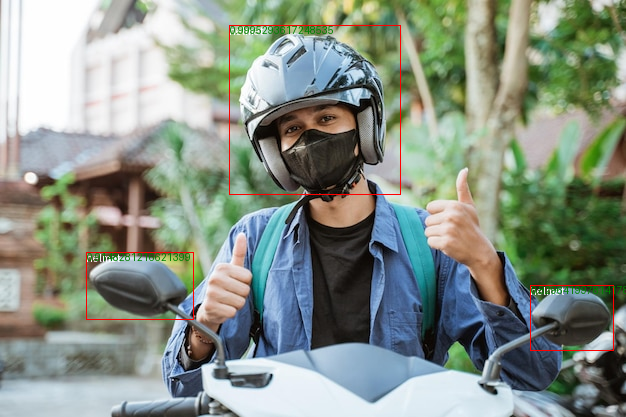

In [ ]:
plot_results(image, results)

### **DEtection TRansformer (DETR)**

**DETR Inference**
You can infer with existing DETR models on Hugging Face Hub like below:

In [24]:
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch
from PIL import Image
import requests

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

# initialize the model
processor = DetrImageProcessor.from_pretrained(
    "facebook/detr-resnet-101", revision="no_timm"
)
model = DetrForObjectDetection.from_pretrained(
    "facebook/detr-resnet-101", revision="no_timm"
)

# preprocess the inputs and infer
inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)

# convert outputs (bounding boxes and class logits) to COCO API
# non max supression above 0.9
target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(
    outputs, target_sizes=target_sizes, threshold=0.9
)[0]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

preprocessor_config.json:   0%|          | 0.00/401 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/79.6k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/243M [00:00<?, ?B/s]

Detected cat with confidence 0.998 at location [344.06, 24.85, 640.34, 373.74]
Detected remote with confidence 0.997 at location [328.13, 75.93, 372.81, 187.66]
Detected remote with confidence 0.997 at location [39.34, 70.13, 175.56, 118.78]
Detected cat with confidence 0.998 at location [15.36, 51.75, 316.89, 471.16]
Detected couch with confidence 0.995 at location [-0.19, 0.71, 639.73, 474.17]


**PyTorch Implementation of DETR**

The implementation of DETR from the original paper is shown below:



In [25]:
import torch
from torch import nn
from torchvision.models import resnet50


class DETR(nn.Module):
    def __init__(
        self, num_classes, hidden_dim, nheads, num_encoder_layers, num_decoder_layers
    ):
        super().__init__()
        self.backbone = nn.Sequential(*list(resnet50(pretrained=True).children())[:-2])
        self.conv = nn.Conv2d(2048, hidden_dim, 1)
        self.transformer = nn.Transformer(
            hidden_dim, nheads, num_encoder_layers, num_decoder_layers
        )
        self.linear_class = nn.Linear(hidden_dim, num_classes + 1)
        self.linear_bbox = nn.Linear(hidden_dim, 4)
        self.query_pos = nn.Parameter(torch.rand(100, hidden_dim))
        self.row_embed = nn.Parameter(torch.rand(50, hidden_dim // 2))
        self.col_embed = nn.Parameter(torch.rand(50, hidden_dim // 2))

    def forward(self, inputs):
        x = self.backbone(inputs)
        h = self.conv(x)
        H, W = h.shape[-2:]
        pos = (
            torch.cat(
                [
                    self.col_embed[:W].unsqueeze(0).repeat(H, 1, 1),
                    self.row_embed[:H].unsqueeze(1).repeat(1, W, 1),
                ],
                dim=-1,
            )
            .flatten(0, 1)
            .unsqueeze(1)
        )
        h = self.transformer(
            pos + h.flatten(2).permute(2, 0, 1), self.query_pos.unsqueeze(1)
        )
        return self.linear_class(h), self.linear_bbox(h).sigmoid()

**Panoptic Segmentation Inference Example with Hugging Face Transformers**

Panoptic segmentation is the task of labeling every pixel in an image with its category and identifying distinct objects within those categories, combining both semantic and instance segmentation.



In [27]:
from transformers import pipeline
from PIL import Image
import requests

segmentation = pipeline("image-segmentation", "facebook/maskformer-swin-base-coco")

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

results = segmentation(images=image, subtask="panoptic")
results

config.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/411M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/utils/deprecation.py:165: FutureWarning: `max_size` is deprecated and removed starting from version 4.27.0 for `MaskFormerImageProcessor.__init__`.
  return func(*args, **kwargs)
Device set to use cpu
`label_ids_to_fuse` unset. No instance will be fused.


[{'score': 0.993197,
  'label': 'remote',
  'mask': <PIL.Image.Image image mode=L size=640x480>},
 {'score': 0.997852,
  'label': 'cat',
  'mask': <PIL.Image.Image image mode=L size=640x480>},
 {'score': 0.998006,
  'label': 'remote',
  'mask': <PIL.Image.Image image mode=L size=640x480>},
 {'score': 0.997469,
  'label': 'cat',
  'mask': <PIL.Image.Image image mode=L size=640x480>}]

**Example use of model**

Let’s see an example use of the model. Dinat backbone requires Natten library, which may take a while to install.



In [28]:
!pip install -q natten

In [2]:
pip install --upgrade transformers natten torch


In [30]:
pip install --upgrade natten


We can see an inference code below depending on different segmentation types.



/usr/local/lib/python3.10/dist-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size'
  return func(*args, **kwargs)
| 2025-01-04 20:16:45,529 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dqkrpb`, which is deprecated in favor of `natten.functional.na2d_qk`. Please consider switching, as this op will be removed soon.
| 2025-01-04 20:18:12,896 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dav`, which is deprecated in favor of `natten.functional.na2d_av`. Please consider switching, as this op will be removed soon.
| 2025-01-04 20:18:25,951 | [[ natten.functional ]] [ WARNING ]: You're calling NATTEN op `natten.functional.natten2dqkrpb`, which is deprecated in favor of `natten.functional.na2d_qk`. Please consider switching, as this op will be removed soon.
| 2025-01-04 20:20:01,757 | [

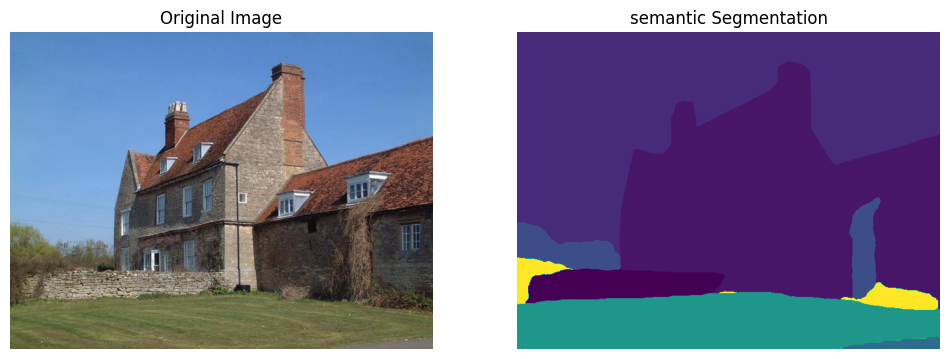

In [3]:
from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation
from PIL import Image
import requests
import matplotlib.pyplot as plt
import warnings
import torch

# Abaikan warning dari natten
warnings.filterwarnings("ignore", category=UserWarning, module="natten")


def run_segmentation(image, task_type):
    """Performs image segmentation based on the given task type.

    Args:
        image (PIL.Image): The input image.
        task_type (str): The type of segmentation to perform ('semantic', 'instance', or 'panoptic').

    Returns:
        PIL.Image: The segmented image.

    Raises:
        ValueError: If the task type is invalid.
    """

    # Load processor dan model hanya sekali untuk efisiensi
    processor = OneFormerProcessor.from_pretrained(
        "shi-labs/oneformer_ade20k_dinat_large"
    )
    model = OneFormerForUniversalSegmentation.from_pretrained(
        "shi-labs/oneformer_ade20k_dinat_large"
    )

    # Gunakan context manager untuk mencegah perhitungan gradien
    with torch.no_grad():
        if task_type == "semantic":
            inputs = processor(images=image, task_inputs=["semantic"], return_tensors="pt")
            outputs = model(**inputs)
            predicted_map = processor.post_process_semantic_segmentation(
                outputs, target_sizes=[image.size[::-1]]
            )[0]

        elif task_type == "instance":
            inputs = processor(images=image, task_inputs=["instance"], return_tensors="pt")
            outputs = model(**inputs)
            predicted_map = processor.post_process_instance_segmentation(
                outputs, target_sizes=[image.size[::-1]]
            )[0]["segmentation"]

        elif task_type == "panoptic":
            inputs = processor(images=image, task_inputs=["panoptic"], return_tensors="pt")
            outputs = model(**inputs)
            predicted_map = processor.post_process_panoptic_segmentation(
                outputs, target_sizes=[image.size[::-1]]
            )[0]["segmentation"]

        else:
            raise ValueError(
                "Invalid task type. Choose from 'semantic', 'instance', or 'panoptic'"
            )

    return predicted_map


def show_image_comparison(image, predicted_map, segmentation_title):
    """Displays the original image and the segmented image side-by-side.

    Args:
        image (PIL.Image): The original image.
        predicted_map (PIL.Image): The segmented image.
        segmentation_title (str): The title for the segmented image.
    """

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_map)
    plt.title(segmentation_title + " Segmentation")
    plt.axis("off")
    plt.show()


# Unduh gambar dari URL
url = "https://huggingface.co/datasets/shi-labs/oneformer_demo/resolve/main/ade20k.jpeg"
response = requests.get(url, stream=True)
response.raise_for_status()  # Check for HTTP errors
image = Image.open(response.raw)

# Jalankan segmentasi dan tampilkan hasilnya
task_to_run = "semantic"
predicted_map = run_segmentation(image, task_to_run)
show_image_comparison(image, predicted_map, task_to_run)
